In [1]:
import cv2
import imutils

from src import config, image_utils, objects_detector
from src.aruco_marker import ArucoMarker
from src.climber_start_position import ClimberStartPosition
from src.model.color import Color
from src.model.point import Point

## Load image

In [2]:
img = cv2.imread('./../datasets/images/test/34.jpeg')
img = imutils.resize(img, width=1216)

## Load Aruco markers

In [3]:
marker = ArucoMarker(config.MARKER_ARUCO_DICT, img, config.MARKER_PERIMETER_IN_CM)

In [4]:
print("ArUco Perimeter: {}".format(marker.get_perimeter()))
print("Pixels per centimeter: {}".format(marker.get_pixels_per_centimeter()))

print("Width in px: {}".format(marker.get_width()))
print("Width in cm: {}".format(marker.get_width_in_cm()))
print("Height in px: {}".format(marker.get_height()))
print("Height in cm: {}".format(marker.get_height_in_cm()))

ArUco Perimeter: 149.73137283325195
Pixels per centimeter: 5.347549029758999
Width in px: 37.33630940518894
Width in cm: 6.981948028416974
Height in px: 37.05401462729781
Height in cm: 6.929158465138514


## Detect objects

In [5]:
detected_objects = objects_detector.detect(img)


0: 1216x928 82 holds, 2020.3ms
Speed: 11.8ms preprocess, 2020.3ms inference, 1.3ms postprocess per image at shape (1, 3, 1216, 928)


# Draw bounding boxes

In [6]:
img = image_utils.draw_bboxes(
    img,
    detected_objects,
    config.BBOX_COLOR,
    config.BBOX_CENTER_COLOR,
    config.LINE_WIDTH,
    override=False
)

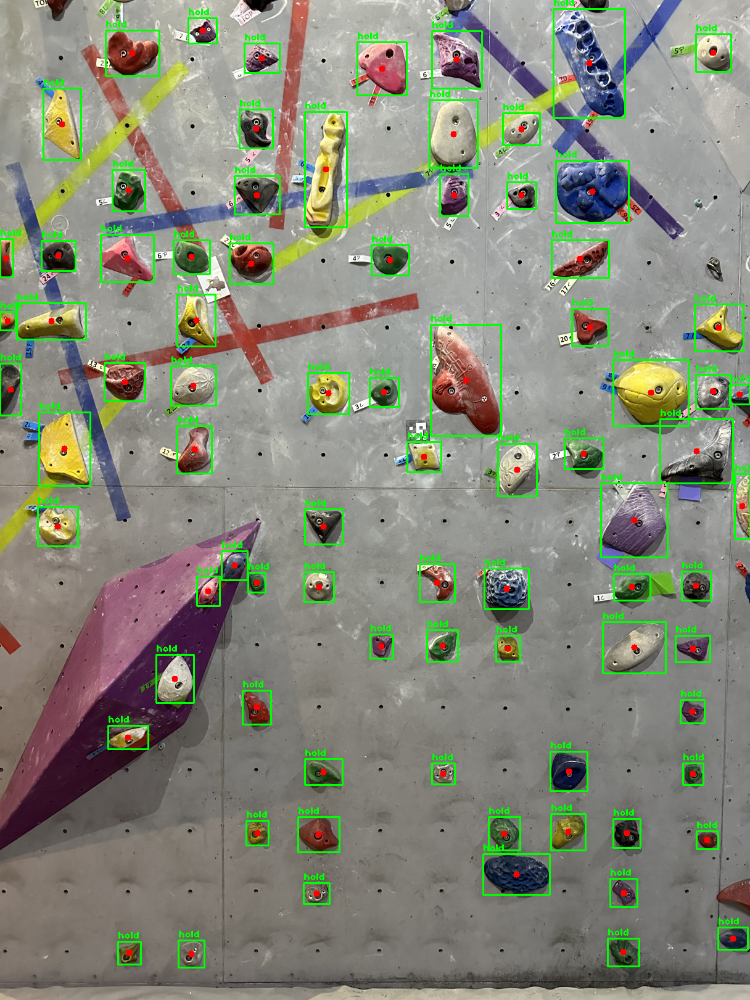

In [7]:
image_utils.display_image(img)

# Find climber starting position

In [8]:
climber_starting_point = ClimberStartPosition(
    img_width=img.shape[1], 
    img_height=img.shape[0], 
    marker=marker, 
    detected_objects=detected_objects
)

In [9]:
climber = climber_starting_point.prepare(
    climber_height_in_cm=config.CLIMBER_HEIGHT_IN_CM,
    starting_steps_max_distance_from_ground_in_cm=40
)

In [10]:
for body_part in [climber.head, climber.neck, climber.trunk, climber.left_shoulder, climber.right_shoulder, climber.left_leg, climber.right_leg, climber.left_hand, climber.right_hand]:
    image_utils.draw_body_part(
        img,
        body_part,
    )
    if body_part.detected_object is not None:
        image_utils.draw_bboxes(
            img=img,
            detected_objects=[body_part.detected_object],
            bbox_color=config.PROBLEM_STEP_BBOX_COLOR,
            bbox_center_color=config.BBOX_CENTER_COLOR,
            line_width=config.LINE_WIDTH
        )
        

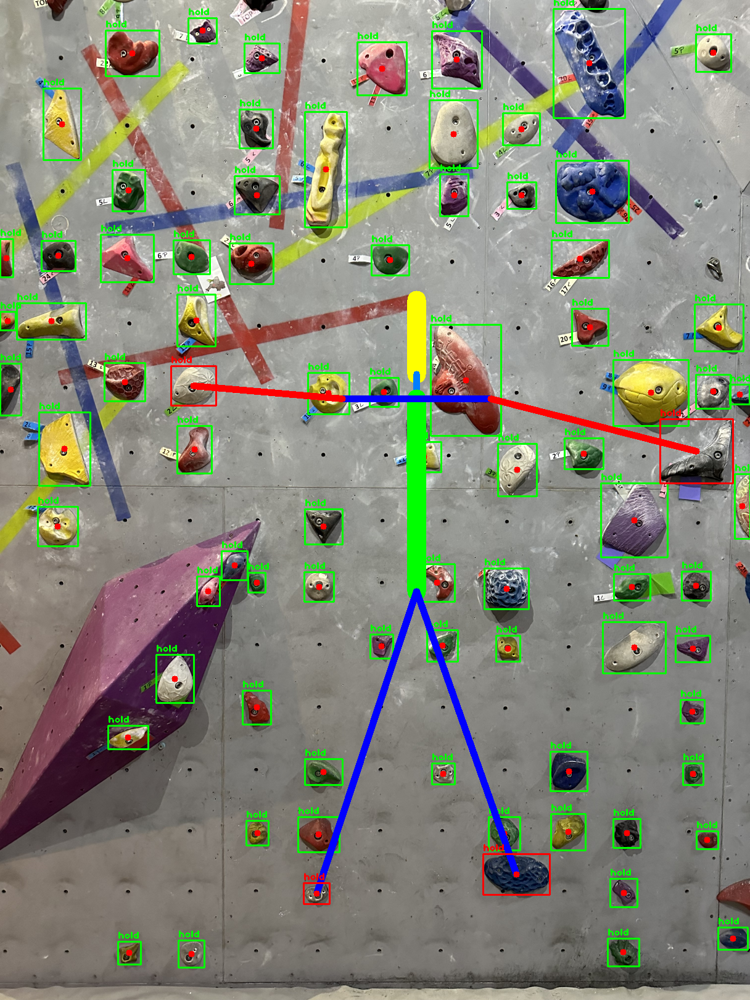

In [11]:
image_utils.display_image(img)

In [12]:
lower_step_point = climber.get_lower_step_point()

twenty_percent_of_climber_leg_height = climber.body_proportion.leg * 0.2
forty_percent_of_climber_leg_height = climber.body_proportion.leg * 0.6

In [13]:
twenty_percent_of_climber_leg_height_point = Point(
    lower_step_point.x,
    int(lower_step_point.y - twenty_percent_of_climber_leg_height)
)

forty_percent_of_climber_leg_height_point = Point(
    lower_step_point.x,
    int(lower_step_point.y - forty_percent_of_climber_leg_height)
)

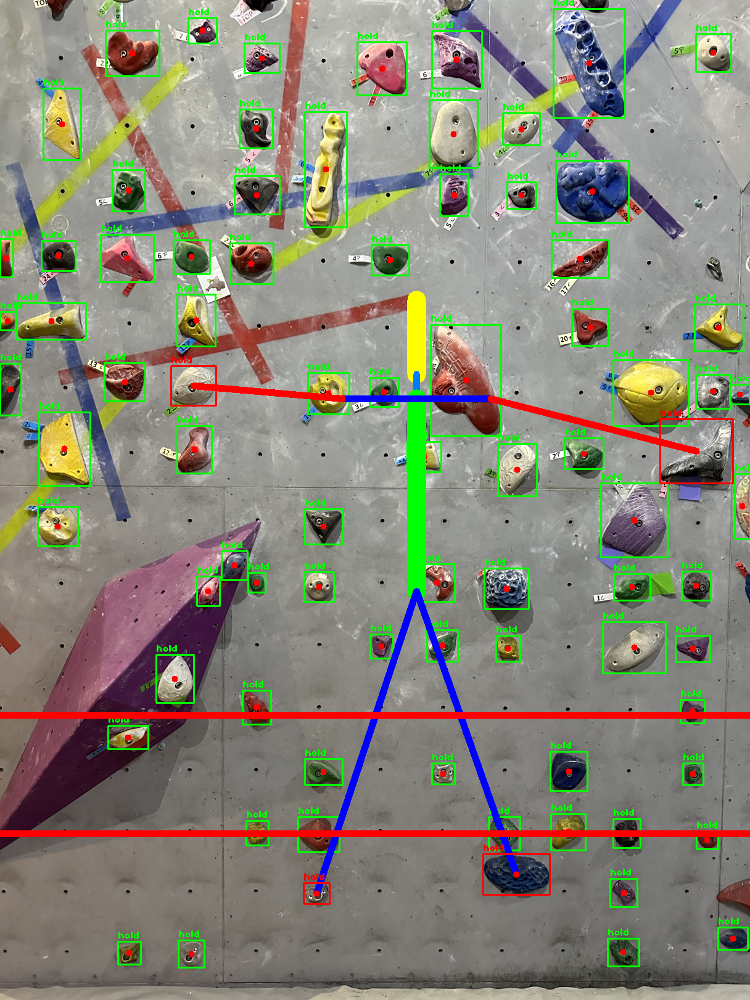

In [14]:
drawn_img = image_utils.draw_line(
    img=img,
    start_point=Point(0, twenty_percent_of_climber_leg_height_point.y),
    end_point=Point(img.shape[1], twenty_percent_of_climber_leg_height_point.y),
    color=Color.red(),
    line_width=10,
    override=False
)

drawn_img = image_utils.draw_line(
    img=drawn_img,
    start_point=Point(0, forty_percent_of_climber_leg_height_point.y),
    end_point=Point(img.shape[1], forty_percent_of_climber_leg_height_point.y),
    color=Color.red(),
    line_width=10,
    override=False
)

image_utils.display_image(drawn_img)

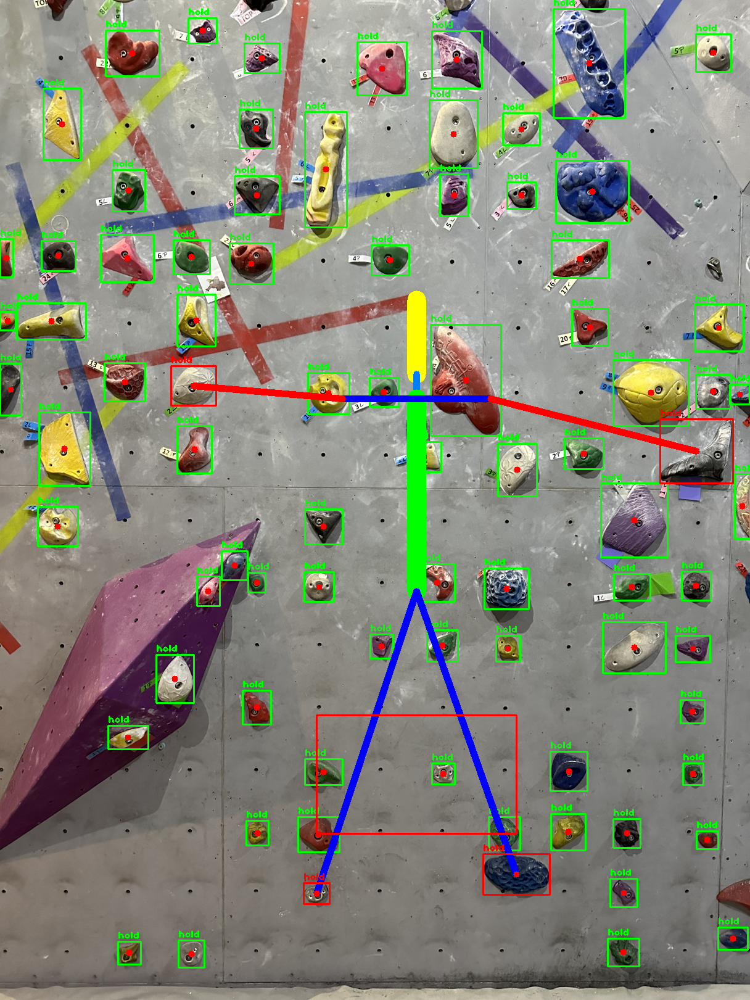

In [23]:
# draw rectangle between 20% and 40% of climber leg height from the lower step point
drawn_img = image_utils.draw_rectangle(
    img=img,
    start_point=Point(climber.get_bottom_left_point().x, twenty_percent_of_climber_leg_height_point.y),
    end_point=Point(climber.get_bottom_right_point().x, forty_percent_of_climber_leg_height_point.y),
    color=Color.red(),
    line_width=config.LINE_WIDTH,
    override=False
)

image_utils.display_image(drawn_img)

In [16]:
left_leg_mid_point = Point(
    (climber.left_leg.start.x + climber.left_leg.end.x) // 2, 
    (climber.left_leg.start.y + climber.left_leg.end.y) // 2
)

In [17]:
right_leg_mid_point = Point(
    (climber.right_leg.start.x + climber.right_leg.end.x) // 2, 
    (climber.right_leg.start.y + climber.right_leg.end.y) // 2
)

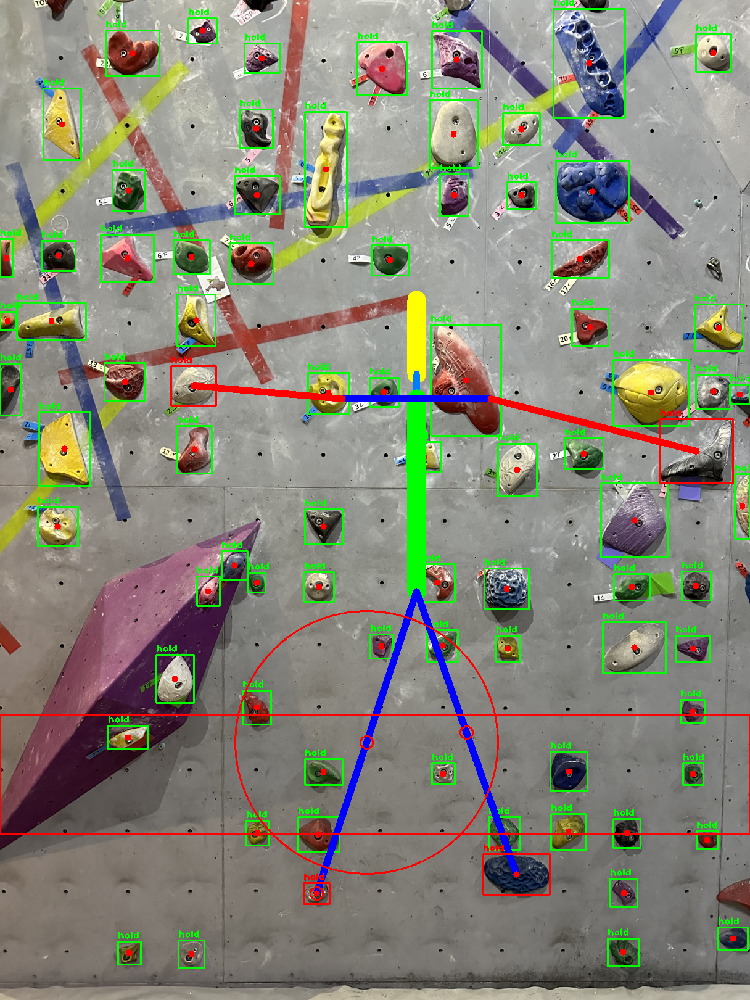

In [18]:
drawn_img = image_utils.draw_circle_around_point(
    img=drawn_img,
    point=climber.get_lower_step_point(),
    radius=10,
    circle_color=Color.red(),
    line_width=config.LINE_WIDTH,
    override=False
)

drawn_img = image_utils.draw_circle_around_point(
    img=drawn_img,
    point=left_leg_mid_point,
    radius=10,
    circle_color=Color.red(),
    line_width=config.LINE_WIDTH,
    override=False
)

drawn_img = image_utils.draw_circle_around_point(
    img=drawn_img,
    point=left_leg_mid_point,
    radius=marker.convert_cm_to_pixel(config.STEP_RADIUS_IN_CM / 2),
    circle_color=Color.red(),
    line_width=config.LINE_WIDTH,
    override=False
)

drawn_img = image_utils.draw_circle_around_point(
    img=drawn_img,
    point=right_leg_mid_point,
    radius=10,
    circle_color=Color.red(),
    line_width=config.LINE_WIDTH,
    override=False
)

image_utils.display_image(drawn_img)